# Using Pretrained Model Weights from Kaggle

#### This notebook is the first step in our pipeline where we load a pre-trained Detectron2 model and use it to predict where the holds are located within the images of the climbing walls. We input the images in data/images and receive a structured output. To prepare the model outputs for our dataset, we took the predictions produced by Detectron2 and reorganized them into the COCO formatuse the model to create on a set of images. 

### Install Dependencies

In [1]:
!pip install --no-build-isolation 'git+https://github.com/facebookresearch/detectron2.git'
!pip install kagglehub
!pip install torchvision
!pip install opencv-python



  Cloning https://github.com/facebookresearch/detectron2.git to /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-ffp4uyub
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /private/var/folders/97/0ktd2h2x56j17zr5v8sj3slr0000gn/T/pip-req-build-ffp4uyub
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (pyproject.toml) ... done

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0 -> 25.3
[notice] To update, run: pip install --upgrade pip


### Import Packages

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import json
import pycocotools.mask as mask_util

### Use Downloaded weights (model_final.pth) and configurations (experiment_config.yml)

In [3]:
cfg = get_cfg()
cfg.merge_from_file("/Users/eden2025/MSAIF25/ml_project_msai/experiment_config.yml")
cfg.MODEL.WEIGHTS = os.path.join(
    "/Users/eden2025/MSAIF25/ml_project_msai",
    "model_final.pth"
)
cfg.MODEL.DEVICE='cpu'

### Testing Sample Image with Weights

In [5]:

SAMPLE_IMAGE = "/Users/eden2025/MSAIF25/ml_project_msai//data/images/IMG_7278.JPG"

/Users/eden2025/MSAIF25/ml_project_msai/.venv/lib/python3.13/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:4319.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W1211 11:12:15.654000 42873 torch/fx/_symbolic_trace.py:52] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


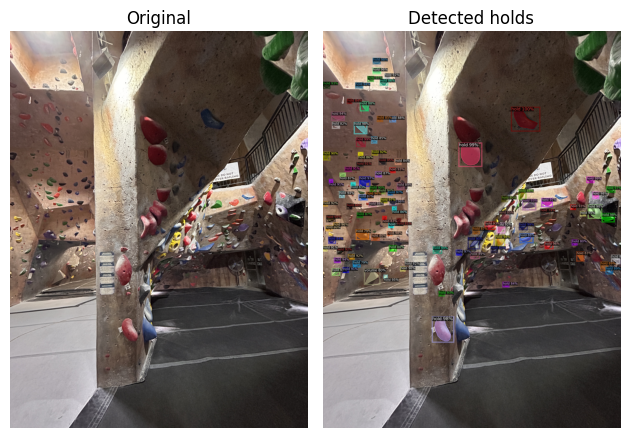

In [6]:

# Set metadata, in this case only the class names for plotting
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

img = cv2.imread(SAMPLE_IMAGE)
outputs = predictor(img)
v = Visualizer(
    img[:, :, ::-1],
    metadata=metadata
)

out_predictions = v.draw_instance_predictions(outputs["instances"].to("cpu"))
img_holds = out_predictions.get_image()
# display the results
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(img[:, :, ::-1])
ax1.axis('off')
ax1.set_title('Original')

ax2.imshow(img_holds)
ax2.axis('off')
ax2.set_title('Detected holds')

fig.tight_layout()
plt.show()

### Putting all our image inputs through pretrained model

IMG_8281.jpeg


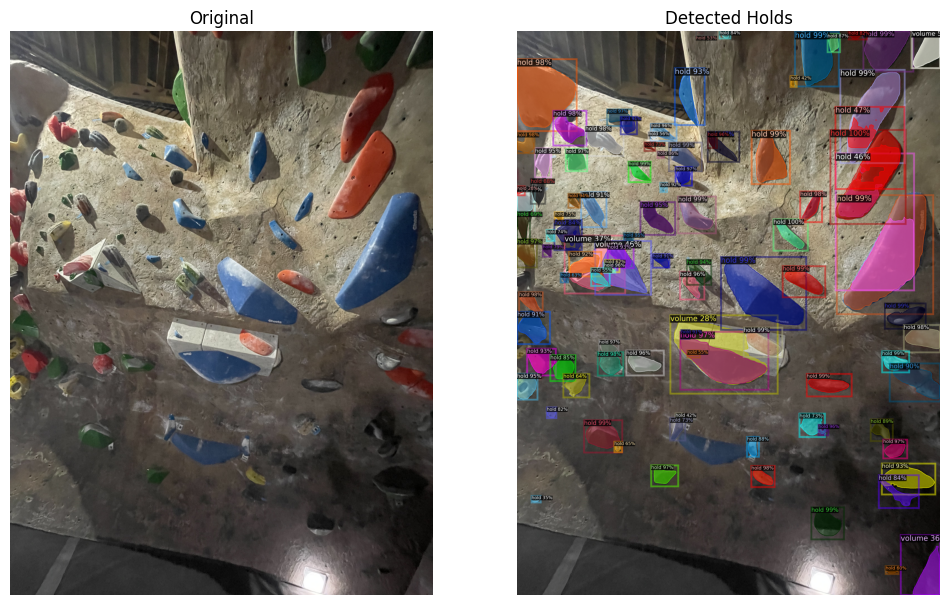

IMG_7461.jpeg


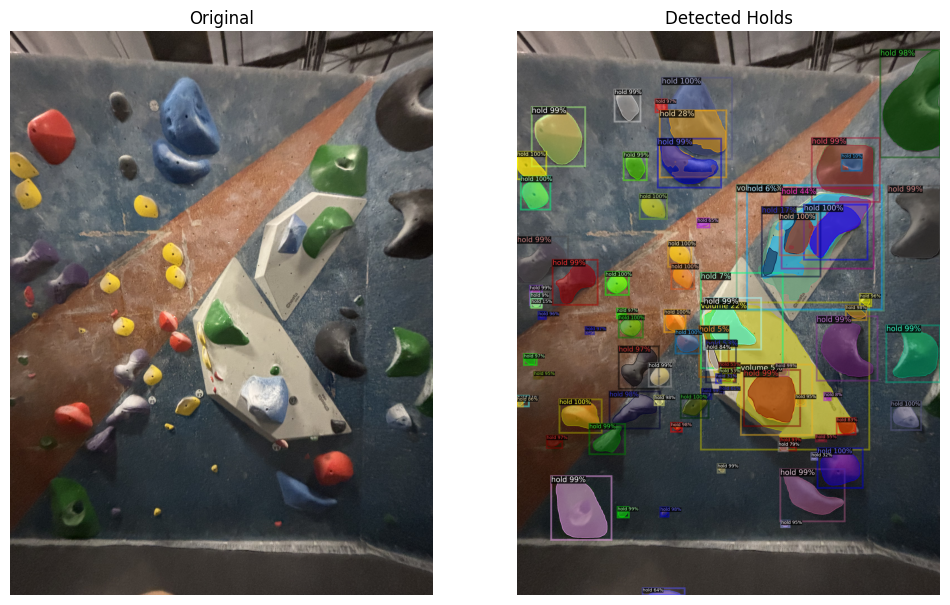

IMG_8307.jpeg


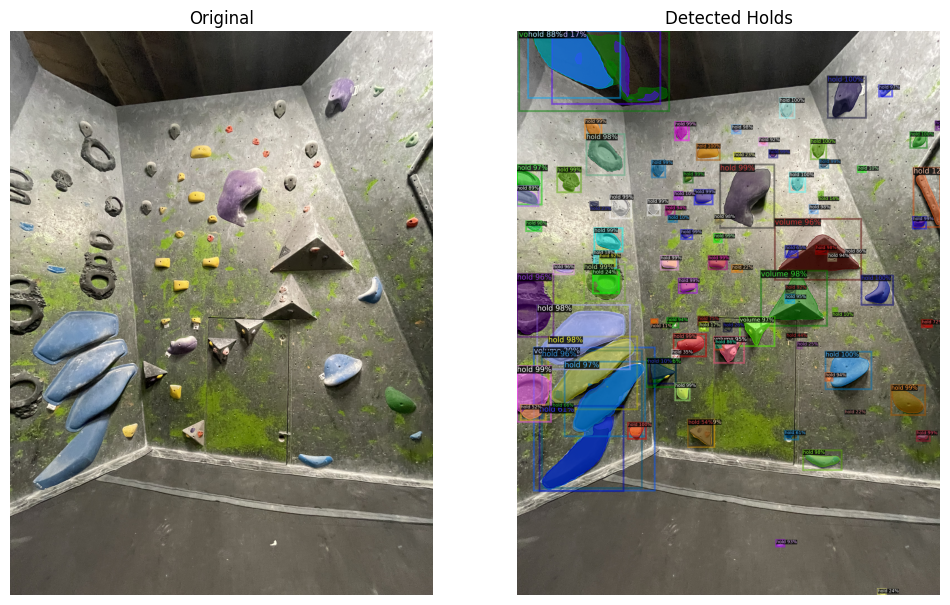

IMG_8366.jpeg


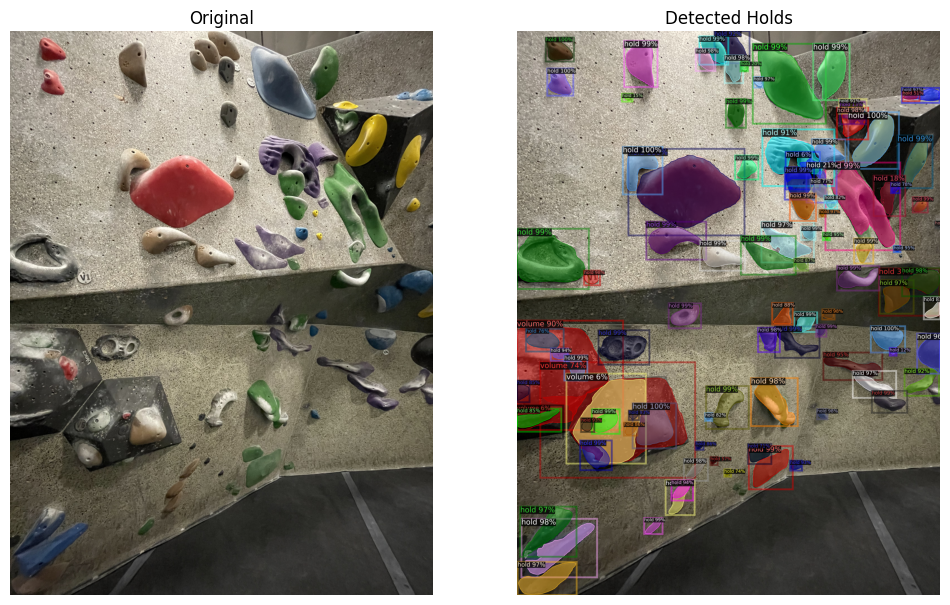

IMG_8389.jpeg


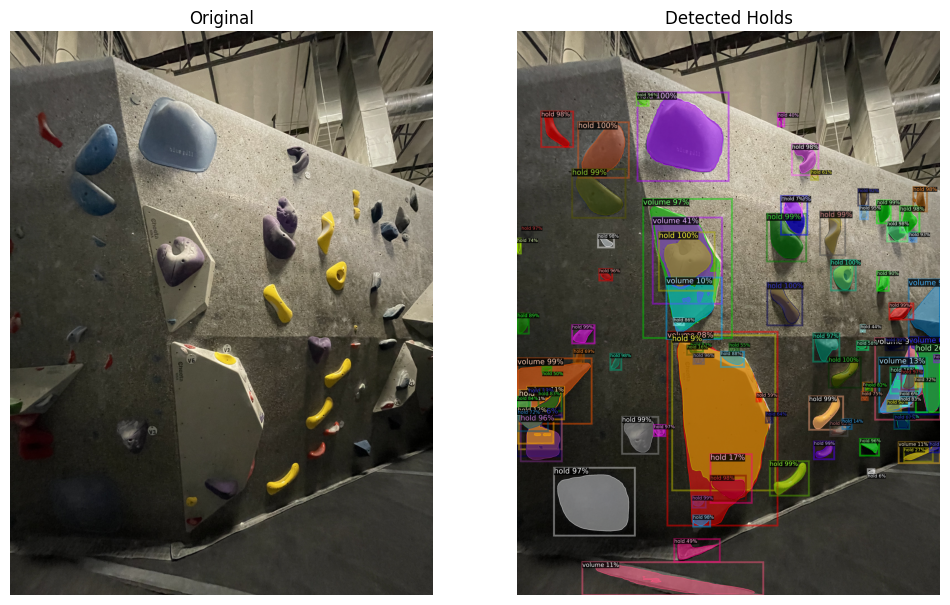

IMG_7456.jpeg
IMG_8388.jpeg
IMG_8326.jpeg
IMG_8371.jpeg
IMG_8351.jpeg
IMG_8310.jpeg
IMG_8384.jpeg
IMG_8296.jpeg
IMG_8279.jpeg
IMG_8392.jpeg
IMG_7283.JPG
IMG_7321.JPG
IMG_7282.JPG
IMG_8287.jpeg
IMG_7294.JPG
IMG_7280.JPG
IMG_8291.jpeg
IMG_7295.JPG
IMG_8301.jpeg
IMG_7291.JPG
IMG_8357.jpeg
IMG_7326.JPG
IMG_7332.JPG
IMG_8316.jpeg
IMG_8382.jpeg
IMG_8361.jpeg
IMG_7324.JPG
IMG_7278.JPG
IMG_7293.JPG
IMG_8377.jpeg
IMG_7300.JPG
IMG_8289.jpeg
IMG_8303.jpeg
IMG_7316.JPG
IMG_8293.jpeg
IMG_8285.jpeg
IMG_7464.jpeg
IMG_7298.JPG
IMG_7313.JPG
IMG_8314.jpeg
IMG_7306.JPG
IMG_8355.jpeg
IMG_7304.JPG
IMG_8334.jpeg
IMG_7338.JPG
IMG_8318.jpeg
IMG_7339.JPG
IMG_8359.jpeg
IMG_8305.jpeg
IMG_8344.jpeg
IMG_7459.jpeg
IMG_8368.jpeg
IMG_7463.jpeg
IMG_8329.jpeg
IMG_8283.jpeg
IMG_8348.jpeg
IMG_8299.jpeg
IMG_8373.jpeg
IMG_8324.jpeg
IMG_8277.jpeg
IMG_8332.jpeg
IMG_8390.jpeg
IMG_7462.jpeg
IMG_8294.jpeg
IMG_8386.jpeg
IMG_7458.jpeg


In [15]:

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions"   # optional
os.makedirs(output_folder, exist_ok=True)
outputs = []
count = 0

# Loop through all images
for filename in os.listdir(images_folder):
    print(filename)
    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    # Run model inference
    outputs = predictor(img)
    # print(output)
    # outputs.append(output)
    
    

    # Visualize predictions
    if count < 5: 
        v = Visualizer(img[:, :, ::-1], metadata=metadata)
        vis_img = v.draw_instance_predictions(outputs["instances"].to("cpu")).get_image()

        # Display side-by-side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
        ax1.imshow(img[:, :, ::-1])
        ax1.axis("off")
        ax1.set_title("Original")

        ax2.imshow(vis_img)
        ax2.axis("off")
        ax2.set_title("Detected Holds")

        plt.show()
        
    count += 1

        # Save result (optional)
        # save_path = os.path.join(output_folder, filename)
        # cv2.imwrite(save_path, vis_img[:, :, ::-1])
        # print(f"Saved: {save_path}")

### Transforming Detectron output into COCO annotation format 

In [11]:

output_file_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

output_folder = os.path.dirname(output_file_path)

In [8]:
import numpy as np
def binary_mask_to_uncompressed_rle(mask):
    """
    Convert a binary mask (H, W) to uncompressed RLE.
    Returns a dict: {"counts": [...], "size": [H, W]}
    """
    mask = np.asfortranarray(mask.astype(np.uint8))  # ensure Fortran order (column major)
    flat = mask.flatten(order="F")

    counts = []
    prev = 0
    run = 0

    for pixel in flat:
        if pixel == prev:
            run += 1
        else:
            counts.append(run)
            run = 1
            prev = pixel

    counts.append(run)

    return {"counts": counts, "size": list(mask.shape)}

In [9]:

# Set metadata
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions/coco_output_annotations.json"

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "hold", "supercategory": "hold"}
    ]
}

ann_id = 1
img_id = 1
count = 0
for filename in os.listdir(images_folder):

    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    height, width = img.shape[:2]

    output = predictor(img)
    instances = output["instances"].to("cpu")

    boxes = instances.pred_boxes.tensor.numpy()
    masks = instances.pred_masks.numpy()
    scores = instances.scores.numpy()  # ← NEW: confidence scores

    coco["images"].append({
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": filename,
        "license": 0,
        "flickr_url": "",
        "coco_url": "",
        "date_captured": 0
    })

    for i in range(len(instances)):

        # ← NEW: filter by confidence threshold
        if scores[i] <= 0.90:
            continue

        x1, y1, x2, y2 = boxes[i]
        bbox = [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]

        rle_compressed = mask_util.encode(
            masks[i].astype("uint8", order="F")
        )
        rle_uncompressed = binary_mask_to_uncompressed_rle(masks[i])

        coco["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": 1,
            "segmentation": rle_uncompressed,
            "bbox": bbox,
            "area": float(mask_util.area(rle_compressed)),
            "iscrowd": 0,
            "score": float(scores[i])  # optional but useful to keep
        })

        ann_id += 1

    img_id += 1


### Processing annotations without confidence threshold

In [ ]:
import os
import json
import cv2
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog
from pycocotools import mask as mask_util
import numpy as np

# Set metadata
MetadataCatalog.get("meta").thing_classes = ["hold", "volume"]
metadata = MetadataCatalog.get("meta")

predictor = DefaultPredictor(cfg)

images_folder = "/Users/eden2025/MSAIF25/ml_project_msai/data/images"
output_json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/predictions/coco_output_annotations.json"

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "hold", "supercategory": "hold"}
    ]
}

ann_id = 1
img_id = 1
count = 0

for filename in os.listdir(images_folder):
    
    # if count > 1:
    #     break

    if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
        continue

    img_path = os.path.join(images_folder, filename)
    img = cv2.imread(img_path)

    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    height, width = img.shape[:2]

    output = predictor(img)
    instances = output["instances"].to("cpu")

    boxes = instances.pred_boxes.tensor.numpy()
    masks = instances.pred_masks.numpy()

    coco["images"].append({
        "id": img_id,
        "width": width,
        "height": height,
        "file_name": filename,
        "license": 0,
        "flickr_url": "",
        "coco_url": "",
        "date_captured": 0
    })
    

    for i in range(len(instances)):
        x1, y1, x2, y2 = boxes[i]
        bbox = [float(x1), float(y1), float(x2 - x1), float(y2 - y1)]

        rle_compressed = mask_util.encode(
            masks[i].astype("uint8", order="F")
        )
        rle_uncompressed = binary_mask_to_uncompressed_rle(masks[i])
        print(rle_uncompressed)


        coco["annotations"].append({
            "id": ann_id,
            "image_id": img_id,
            "category_id": 1,
            "segmentation": rle_uncompressed,
            "bbox": bbox,
            "area": float(mask_util.area(rle_compressed)),
            "iscrowd": 0
        })


        ann_id += 1
        
    count += 1

    img_id += 1



{'counts': [9186182, 19, 3998, 49, 3980, 54, 3975, 58, 3972, 62, 3968, 65, 3965, 68, 3962, 71, 3960, 73, 3958, 75, 3956, 76, 3954, 78, 3953, 79, 3951, 82, 3949, 83, 3946, 86, 3943, 89, 3940, 92, 3937, 95, 3934, 98, 3931, 102, 3927, 105, 3923, 109, 3921, 111, 3919, 113, 3918, 114, 3917, 116, 3914, 118, 3913, 119, 3913, 119, 3912, 120, 3910, 123, 3908, 124, 3907, 125, 3905, 127, 3903, 130, 3900, 132, 3897, 135, 3895, 138, 3892, 140, 3890, 142, 3888, 145, 3886, 146, 3885, 147, 3884, 149, 3882, 150, 3881, 151, 3880, 153, 3879, 153, 3878, 155, 3876, 156, 3875, 157, 3874, 159, 3872, 160, 3871, 162, 3868, 164, 3866, 167, 3863, 169, 3860, 173, 3857, 175, 3855, 177, 3853, 180, 3850, 182, 3849, 184, 3847, 185, 3845, 188, 3843, 189, 3842, 190, 3841, 191, 3840, 192, 3838, 195, 3836, 196, 3834, 198, 3831, 201, 3829, 203, 3827, 205, 3824, 208, 3822, 210, 3819, 213, 3817, 215, 3814, 218, 3812, 221, 3809, 223, 3807, 225, 3806, 226, 3805, 227, 3804, 228, 3803, 229, 3802, 230, 3801, 231, 3799, 233, 3798

In [12]:

with open(output_file_path, "w") as f:
    json.dump(coco, f)

### Checking Created Annotations 

In [13]:
import json

json_path = "/Users/eden2025/MSAIF25/ml_project_msai/data/coco_output_predictions.json"

# # Load the COCO file
with open(json_path, "r") as f:
    coco = json.load(f)

annotations = coco.get("annotations", [])

# Print first 100 (or fewer if not available)
num_to_print = min(100, len(annotations))

print(f"Showing {num_to_print} of {len(annotations)} annotations:\n")

for i in range(num_to_print):
    ann = annotations[i]
    print(f"Annotation {i+1}:")
    print(json.dumps(ann, indent=2))
    print("-" * 80)


Showing 100 of 4541 annotations:

Annotation 1:
{
  "id": 1,
  "image_id": 1,
  "category_id": 1,
  "segmentation": {
    "counts": [
      9186182,
      19,
      3998,
      49,
      3980,
      54,
      3975,
      58,
      3972,
      62,
      3968,
      65,
      3965,
      68,
      3962,
      71,
      3960,
      73,
      3958,
      75,
      3956,
      76,
      3954,
      78,
      3953,
      79,
      3951,
      82,
      3949,
      83,
      3946,
      86,
      3943,
      89,
      3940,
      92,
      3937,
      95,
      3934,
      98,
      3931,
      102,
      3927,
      105,
      3923,
      109,
      3921,
      111,
      3919,
      113,
      3918,
      114,
      3917,
      116,
      3914,
      118,
      3913,
      119,
      3913,
      119,
      3912,
      120,
      3910,
      123,
      3908,
      124,
      3907,
      125,
      3905,
      127,
      3903,
      130,
      3900,
      132,
      3897,
      135,
      389